# Tutorial 6: Stereo-seq mouse embryo E10.5_E1S3

In this tutorial, we demonstrate how to apply STGMVA to Stereo-seq data for spatial domains identification. We take mouse embryo 10.5 data as example and set the number of clusters as 16. Mouse embryo Stereo-seq data were downloaded from https://db.cngb.org/stomics/mosta/ and provided at https://zenodo.org/record/8141084.

Before running the model, please download input data by the link above.


## Loading package

In [3]:
import os
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from STGMVA.STGMVA import STGMMVE
from STGMVA import read_adata
from STGMVA import mk_dir

2023-07-14 21:58:52.180988: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Reading ST data and showing the manual annotation in Stereo-seq study

In [3]:
adata = sc.read("/home/tengliu/Paper6-NC/STGMVA_Tutorials/ST data/E10.5_E1S3.MOSTA.h5ad") # read data

Only considering the two last: ['.MOSTA', '.h5ad'].
Only considering the two last: ['.MOSTA', '.h5ad'].


In [5]:
adata

AnnData object with n_obs × n_vars = 18670 × 25647
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'spatial_leiden_res4', 'Regulon - 1700009N14Rik', 'Regulon - 2610044O15Rik8', 'Regulon - AU041133', 'Regulon - Abcf2', 'Regulon - Alx1', 'Regulon - Alx3', 'Regulon - Arid3a', 'Regulon - Arid3c', 'Regulon - Arnt', 'Regulon - Arx', 'Regulon - Atf1', 'Regulon - Atf2', 'Regulon - Atf3', 'Regulon - Atf4', 'Regulon - Atf6', 'Regulon - Atoh1', 'Regulon - Barhl1', 'Regulon - Barhl2', 'Regulon - Bcl11a', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlhe22', 'Regulon - Bhlhe41', 'Regulon - Bmyc', 'Regulon - Borcs8', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Cebpa', 'Regulon - Cebpb', 'Regulon - Cebpd', 'Regulon - Cebpe', 'Regulon - Cebpg', 'Regulon - Chd1', 'Regulon - Clock', 'Regulon - Cnot3', 'Regulon - Creb1', 'Regulon - Creb3', 'Regulon - Creb3l1', 'Regulon - Crebzf', 'Regulon - Crem', 'Regulon - Crx', 'Regulon - Ctcf', 'Reg

## Create directory for pretrained model

In [6]:
save_path='./results_save/'
section_id = 'mouse_embryos_E10.5_E1S3'
mk_dir(save_path,section_id)

## Training the model

STGMVA aims to learn the representations by two-step process. First, pretrained the GMM clustering model. Second, discerned the spatial domains for spatial transcriptomics data. 

After model training, the learned representations will be saved in adata.obsm['embedding'], and can be used for spatial clustering. 

In [7]:
model = STGMMVE(adata, datatype = "Stereo", nCluster=16,save_path=save_path, section_id=section_id)

# model.pretrain() # Train your own pretranined model or use the pretrained model we provided.

adata_res = model.train_cluster()


/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Graph constructed!


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 5.4.10
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


  0%|          | 0/50 [01:59<?, ?it/s]

Epoch: 0
NMI=0.696584, ARI=0.699695
Loss=94.2251,  ELBO Loss=148.2846


 10%|█         | 5/50 [08:26<1:01:22, 81.82s/it] 

Epoch: 5
NMI=0.681753, ARI=0.689614
Loss=95.7493,  ELBO Loss=128.3573


 20%|██        | 10/50 [15:58<57:12, 85.81s/it]  

Epoch: 10
NMI=0.659111, ARI=0.546236
Loss=96.4591,  ELBO Loss=119.0897


 30%|███       | 15/50 [21:03<38:33, 66.11s/it]

Epoch: 15
NMI=0.642345, ARI=0.509034
Loss=95.9216,  ELBO Loss=113.5577


 40%|████      | 20/50 [26:20<28:15, 56.51s/it]

Epoch: 20
NMI=0.646638, ARI=0.519938
Loss=96.1766,  ELBO Loss=111.2885


 50%|█████     | 25/50 [31:04<27:29, 65.97s/it]

Epoch: 25
NMI=0.650247, ARI=0.521339
Loss=95.8255,  ELBO Loss=109.6407


 60%|██████    | 30/50 [36:08<17:57, 53.89s/it]

Epoch: 30
NMI=0.666027, ARI=0.541878
Loss=95.6419,  ELBO Loss=108.8884


 70%|███████   | 35/50 [40:36<15:39, 62.65s/it]

Epoch: 35
NMI=0.662663, ARI=0.579486
Loss=95.1746,  ELBO Loss=108.1149


 80%|████████  | 40/50 [46:22<09:32, 57.22s/it]

Epoch: 40
NMI=0.654593, ARI=0.525815
Loss=94.9800,  ELBO Loss=107.6886


 90%|█████████ | 45/50 [51:28<05:51, 70.20s/it]

Epoch: 45
NMI=0.650165, ARI=0.495332
Loss=94.9545,  ELBO Loss=107.5706


100%|██████████| 50/50 [55:43<00:00, 66.87s/it]


In [8]:
adata_res

AnnData object with n_obs × n_vars = 18670 × 25647
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'spatial_leiden_res4', 'Regulon - 1700009N14Rik', 'Regulon - 2610044O15Rik8', 'Regulon - AU041133', 'Regulon - Abcf2', 'Regulon - Alx1', 'Regulon - Alx3', 'Regulon - Arid3a', 'Regulon - Arid3c', 'Regulon - Arnt', 'Regulon - Arx', 'Regulon - Atf1', 'Regulon - Atf2', 'Regulon - Atf3', 'Regulon - Atf4', 'Regulon - Atf6', 'Regulon - Atoh1', 'Regulon - Barhl1', 'Regulon - Barhl2', 'Regulon - Bcl11a', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlhe22', 'Regulon - Bhlhe41', 'Regulon - Bmyc', 'Regulon - Borcs8', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Cebpa', 'Regulon - Cebpb', 'Regulon - Cebpd', 'Regulon - Cebpe', 'Regulon - Cebpg', 'Regulon - Chd1', 'Regulon - Clock', 'Regulon - Cnot3', 'Regulon - Creb1', 'Regulon - Creb3', 'Regulon - Creb3l1', 'Regulon - Crebzf', 'Regulon - Crem', 'Regulon - Crx', 'Regulon - Ctcf', 'Reg

## Visualization

In [1]:
import scanpy as sc
adata_res = sc.read_h5ad('/home/tengliu/Paper6-NC/STGMVA_Tutorials/mouse_embryo_E1S3.h5ad')

/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


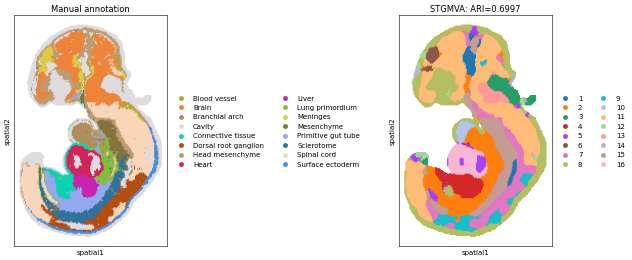

In [4]:

sq.pl.spatial_scatter(adata_res, color=["annotation","pre_label"], size=15, figsize=(8,6),dpi=50,
                      title=["Manual annotation",'STGMVA:' + ' ARI=%.4f'%np.max(adata_res.uns["ari_list"])],
                      shape=None)

## Save the results for more figures

In [12]:
adata_res.filename = './'+"mouse_embryo_E10.5_E1S3.h5ad"